# Homework 8 

### Oliver Muellerklein  
 


In [1]:
import os

def getWorkDir():
    return os.getcwd()

def setWorkDir(newPath):
    os.chdir(newPath)
    print("\nNew working directory: ", os.getcwd())
    return True

In [2]:
getWorkDir()

'/Users/kschocz/Documents/berkeley-courses/second-year/fall16/python-ds-seminar/homeworks/hw8'

In [3]:
#setWorkDir(os.path.join(os.getcwd(), 'foo_bar'))

# Question 1: counting objects 

Segment the image, and then calculate the area and eccentricity of each coin. As input, use the image `skimage.data.coins`.  

There are various ways to do this.  One would be:

1. Equalize the input image (see `skimage.exposure`)
2. Threshold the image (`skimage.filters.otsu`)
3. Remove objects touching the boundary (`skimage.segmentation.clear_border`)
4. Apply morphological closing (`skimage.morphology.closing`)
5. Remove small objects (`skimage.measure.regionprops`).
   Visualize the results if you want with `skimage.color.label2rgb`.
7. Calculate the area and eccentricity of each coin, and display the
   original image with this information on it (`matplotlib.pyplot.text` or `matplotlib.pyplot.annotate`)

### Step 1: Utility Functions for Image Pre-Processing

In [4]:
def show_images(images, titles = None):
    """Display a list of images"""
    n_ims = len(images)
    if titles is None: titles = ['(%d)' % i for i in range(1,n_ims + 1)]
    fig = plt.figure()
    n = 1
    for image,title in zip(images, titles):
        a = fig.add_subplot(1,n_ims,n) # Make subplot
        if image.ndim == 2: # Is image grayscale?
            plt.gray() # Only place in this blog you can't replace 'gray' with 'grey'
        plt.imshow(image)
        a.set_title(title)
        n += 1
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_ims)
    plt.show()
    

def compare_images(*images, **kwargs):
    """
    Utility function to display images side by side.
    
    Parameters
    ----------
    image0, image1, image2, ... : ndarrray
        Images to display.
    labels : list
        Labels for the different images.
    """
    f, axes = plt.subplots(1, len(images), **kwargs)
    axes = np.array(axes, ndmin=1)
    
    labels = kwargs.pop('labels', None)
    if labels is None:
        labels = [''] * len(images)
    
    for n, (image, label) in enumerate(zip(images, labels)):
        axes[n].imshow(image, interpolation='nearest', cmap='gray')
        axes[n].set_title(label)
        axes[n].axis('off')
    
    f.tight_layout()


    
def getRestoredImg(iimg):
    iimg_restore = restoration.denoise_bilateral(iimg)
    return iimg_restore

def getExposedImg(iimg, hEnhance = False):
    if hEnhance:
        iimg_equ = exposure.equalize_adapthist(iimg)
    else:
        iimg_equ = exposure.equalize_hist(iimg)
    return iimg_equ

def print_cv_score_summary(model, xx, yy, cv):
    scores = cross_val_score(model, xx, yy, cv=cv, n_jobs=1)
    print("mean: {:3f}, stdev: {:3f}".format(
        np.mean(scores), np.std(scores)))

def splitScale(ddat, nPart):
    try:
        from sklearn.model_selection import train_test_split
    except:
        print("Could not import sklearn.cross_validation for train_test_split")
    
    np.random.shuffle(ddat)
    numObs = ddat.shape[0]
    numCol = ddat.shape[1] - 1
    xddat = ddat[:, 1:numCol]
    yddat = ddat[:, numCol]
    
    # remember: many methods work better on scaled X
    xScaled = preprocessing.scale(xddat)
    xTrain, xTest, yTrain, yTest = train_test_split(xScaled, yddat, train_size = nPart, random_state = 1738)
    #xddat.iloc[xTrain] # return dataframe train
    return (xTrain, xTest, yTrain, yTest)
    
   

### Step 2: Segment and compare regions 

**Note: ** from SciKit-image tutorial / example. 


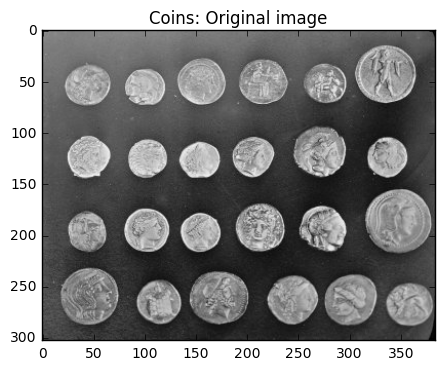

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data

%matplotlib inline

coins_og = data.coins()
show_images([coins_og], titles = ["Coins: Original image"])

hist, bin_edges = np.histogram(coins_og, bins = np.arange(0, 256))

(0, 255)

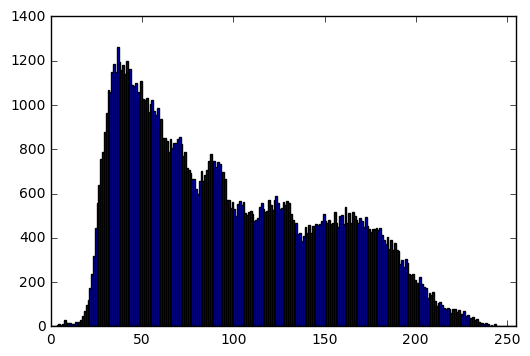

In [6]:
plt.bar(bin_edges[:-1], hist, width=1) and plt.xlim(min(bin_edges), max(bin_edges))

From the histogram of gray values we could decide thresholds for segmentation. 

So we can explore several options for edge / segmentation detection, including: 

1. Gradient edge detection 
2. Markers for edge dropout (from gray value histogram) 
3. And find area and eccentricity of the coins 

In [8]:
from skimage.filters import sobel
from skimage.morphology import watershed
from skimage.morphology import closing
from skimage.measure import label, regionprops
from skimage.color import label2rgb

# Markers from gray-histogram: for dropout / flood 
markers = np.zeros_like(coins_og)
markers[coins_og < 30] = 1
markers[coins_og > 150] = 2

# Edge detection based on gradients, watershed, close holes 
coins_sob = sobel(coins_og)
coins_seg = watershed(coins_sob, markers)
coins_seg_clo = closing(coins_seg - 1)
coins_label = label(coins_seg)
coins_label_rgb = label2rgb(coins_label, image = coins_og)

# Region properties: for coin loop 
coin_reg = regionprops(coins_label)
len(coin_reg)


27

### Step 3: Area and Eccentricity 

Where eccentricity is the curve of the coins from circularity. 

In [9]:
all_areas = []
all_ecc = []
area_sum = 0
ecc_sum = 0
counterr = 1 

for props in coin_reg:
    y0, x0 = props.centroid
    
    coin_area = props.area
    coin_ecc = props.eccentricity
    
    all_areas.append(coin_area)
    all_ecc.append(coin_ecc)
    area_sum = area_sum + coin_area 
    ecc_sum = ecc_sum + coin_ecc 
    counterr = counterr + 1 

counterr

28

In [10]:
area_avg = area_sum / counterr
ecc_avg = ecc_sum / counterr 
area_avg

4155.4285714285716

In [11]:
ecc_avg

0.3712108031841629

**Above shows the average area and eccentricities of the coins** 



### Step 4: Plot coins with values overlayed 

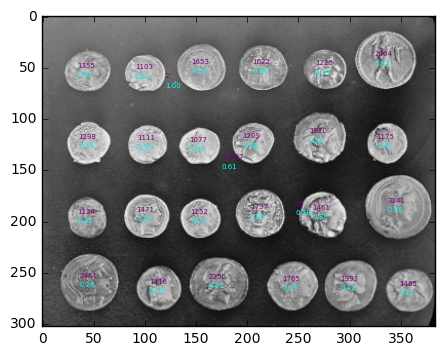

In [12]:
# Plotting
fig, ax = plt.subplots()

ax.imshow(coins_og, cmap = 'gray')

for props in coin_reg:
    y0, x0 = props.centroid
    
    coin_area = props.area
    coin_ecc = props.eccentricity
    
    ax.annotate(coin_area, xy = (x0, y0), xytext = (x0 - 10, y0 - 5), fontsize = 5, color = 'purple')
    ax.annotate('%.2f' % coin_ecc, xy = (x0, y0), xytext = (x0 - 10, y0 + 4), fontsize = 5, color = 'cyan')   

### Step 5: Full coin code 

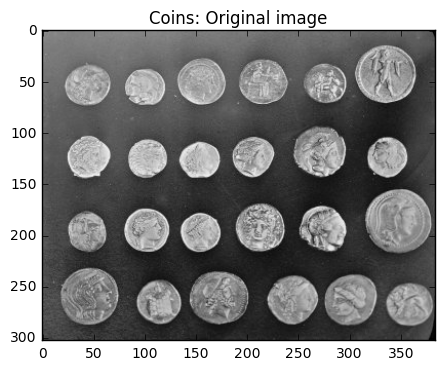


----------

Average area of coins:  4155.42857143
Average eccentricity of coins:  0.3712108031841629

----------



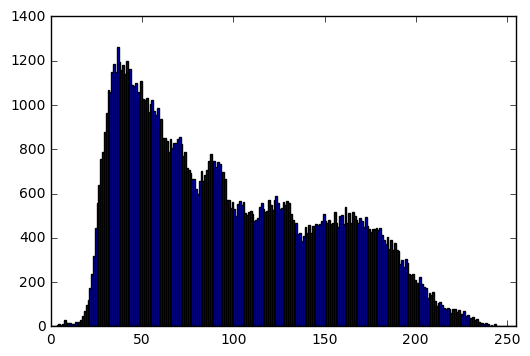

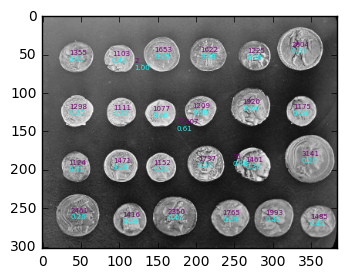

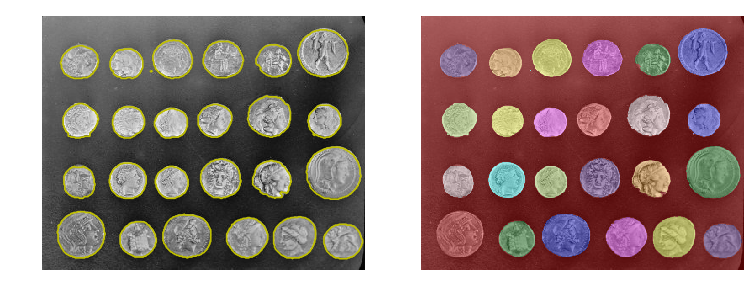

In [14]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from skimage.data import coins
from skimage.filters import sobel
from skimage.morphology import watershed
from skimage.morphology import closing
from skimage.measure import label, regionprops
from skimage.color import label2rgb

# Read in data and visualize 
coins_og = data.coins()
show_images([coins_og], titles = ["Coins: Original image"])

hist, bin_edges = np.histogram(coins_og, bins = np.arange(0, 256))
plt.bar(bin_edges[:-1], hist, width=1) and plt.xlim(min(bin_edges), max(bin_edges))

# Markers from gray-histogram: for dropout / flood 
markers = np.zeros_like(coins_og)
markers[coins_og < 30] = 1
markers[coins_og > 150] = 2

# Edge detection based on gradients, watershed, close holes 
coins_sob = sobel(coins_og)
coins_seg = watershed(coins_sob, markers)
coins_seg_clo = closing(coins_seg - 1)
coins_label = label(coins_seg)
coins_label_rgb = label2rgb(coins_label, image = coins_og)

# Region properties: initalize for coin loop 
coin_reg = regionprops(coins_label)
#len(coin_reg)

# Plotting
fig, ax = plt.subplots(figsize = (8, 3))

ax.imshow(coins_og, cmap = 'gray')

all_areas = []
all_ecc = []
area_sum = 0
ecc_sum = 0
counterr = 1 

for props in coin_reg:
    y0, x0 = props.centroid
    
    coin_area = props.area
    coin_ecc = props.eccentricity
    all_areas.append(coin_area)
    all_ecc.append(coin_ecc)
    area_sum = area_sum + coin_area 
    ecc_sum = ecc_sum + coin_ecc 
    counterr = counterr + 1 
    
    ax.annotate(coin_area, xy = (x0, y0), xytext = (x0 - 10, y0 - 5), fontsize = 5, color = 'purple')
    ax.annotate('%.2f' % coin_ecc, xy = (x0, y0), xytext = (x0 - 10, y0 + 4), fontsize = 5, color = 'cyan') 
    
    
area_avg = area_sum / counterr 
ecc_avg = ecc_sum / counterr 

print("\n----------\n")
print("Average area of coins: ", area_avg)
print("Average eccentricity of coins: ", ecc_avg)
print("\n----------\n")

#### And try watershed with ndi 
## Note: from SciKit-Image tutorial 
from scipy import ndimage as ndi

full_seg = ndi.binary_fill_holes(coins_seg - 1)
coins_label, _ = ndi.label(full_seg)
img_label_overlay = label2rgb(coins_label, image = coins_og)
fig, axes = plt.subplots(1, 2, figsize = (8, 3), sharey = True)
axes[0].imshow(coins_og, cmap = plt.cm.gray, interpolation = 'nearest')
axes[0].contour(full_seg, [0.5], linewidths = 1.2, colors = 'y')
axes[1].imshow(img_label_overlay, interpolation = 'nearest')

for axx in axes:
    axx.axis('off')
    axx.set_adjustable('box-forced')

plt.tight_layout()

# Question 2: Panorama Stiching 

In [18]:
setWorkDir(os.path.join(os.getcwd(), 'pan_imgs/'))
getWorkDir()


New working directory:  /Users/kschocz/Documents/berkeley-courses/second-year/fall16/python-ds-seminar/homeworks/hw8/pan_imgs


'/Users/kschocz/Documents/berkeley-courses/second-year/fall16/python-ds-seminar/homeworks/hw8/pan_imgs'

In [19]:
from __future__ import division, print_function
%matplotlib inline

import skimage.io as io
import os, os.path

img_paths = os.listdir(getWorkDir())
len(img_paths)

all_imgs = []

for imgg in img_paths: 
    all_imgs.append(io.imread(imgg))

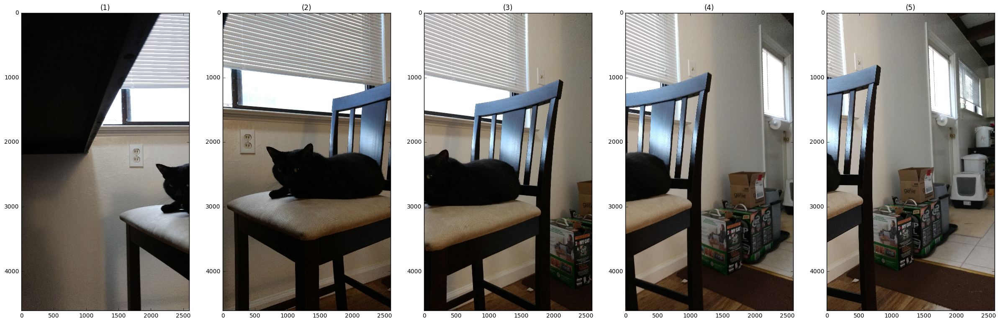

In [20]:
show_images(all_imgs)

### Step 1: Gray scale and feature detection 

After seeing the original images above, we can gray scale, resize, and check them out again. Then we can perform feature detection and matching to approximate or visually estimate the transformations needed to stich the images together. 

In [21]:
from skimage.color import rgb2gray

img0, img1, img2, img3, img4 = [rgb2gray(imgg) for imgg in all_imgs]
gray_imgs = [img0, img1, img2, img3]

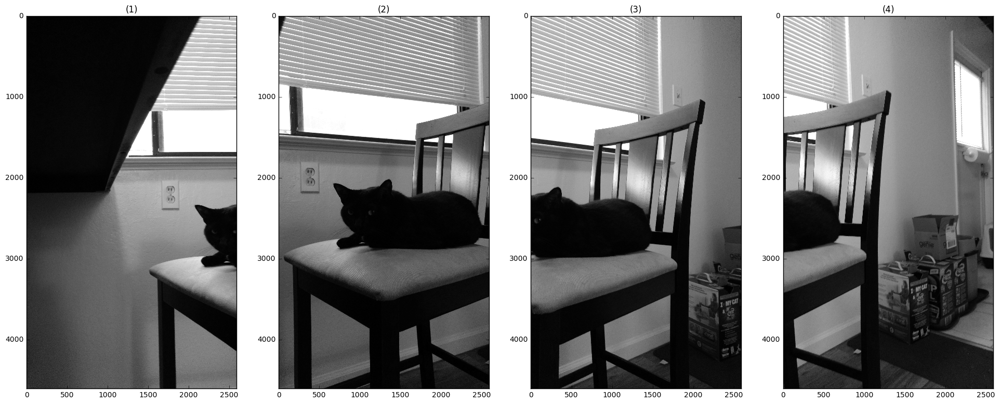

In [22]:
show_images(gray_imgs)

In [23]:
from skimage.feature import ORB

orb_inst = ORB(n_keypoints = 850, fast_threshold = 0.05)

## Detect keypoints 
orb_inst.detect_and_extract(gray_imgs[1])
img0_key = orb_inst.keypoints 
img0_desc = orb_inst.descriptors

orb_inst.detect_and_extract(gray_imgs[2])
img1_key = orb_inst.keypoints 
img1_desc = orb_inst.descriptors

orb_inst.detect_and_extract(gray_imgs[3])
img2_key = orb_inst.keypoints 
img2_desc = orb_inst.descriptors

#orb_inst.detect_and_extract(gray_imgs[3])
#img3_key = orb_inst.keypoints 
#img3_desc = orb_inst.descriptors

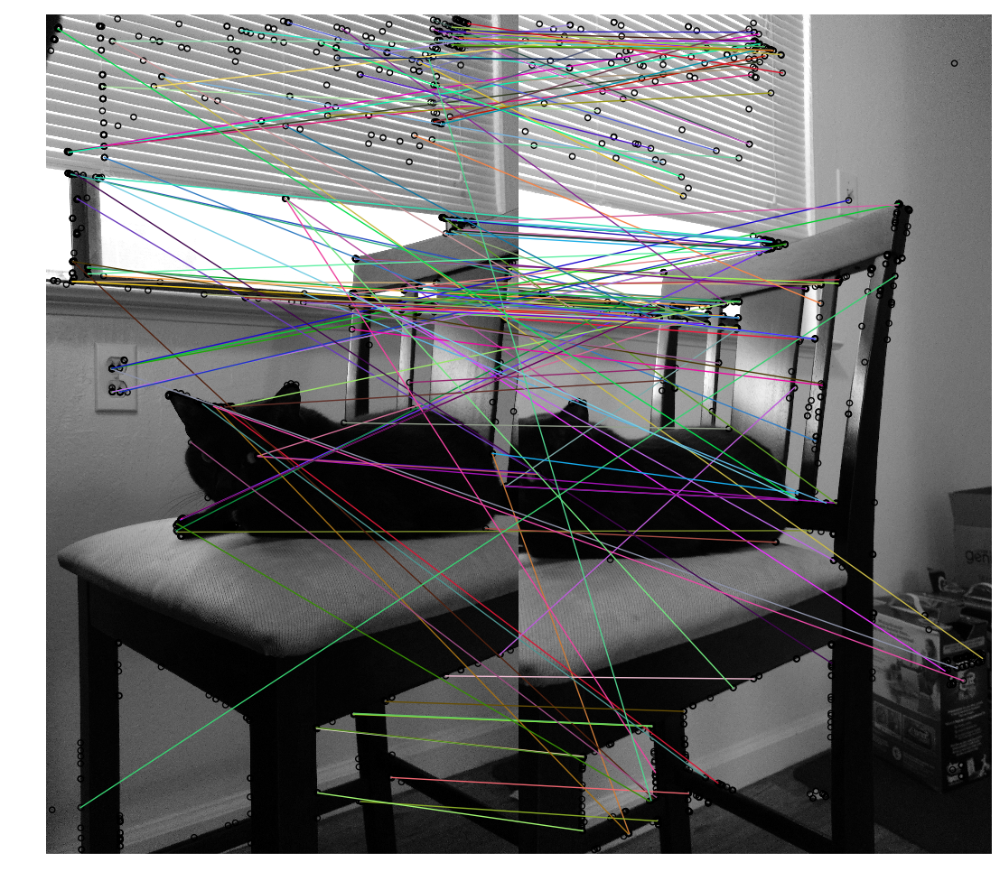

In [25]:
from skimage.feature import match_descriptors
from skimage.feature import plot_matches

## Pairwise descriptor matching: Left to Right 
img0_to_img1 = match_descriptors(img0_desc, img1_desc, cross_check = True)
img1_to_img2 = match_descriptors(img1_desc, img2_desc, cross_check = True)
#img2_to_img3 = match_descriptors(img2_desc, img3_desc, cross_check = True)

fig, ax = plt.subplots(1, 1, figsize = (15, 12))
plot_matches(ax, gray_imgs[1], gray_imgs[2], img0_key, img1_key, img0_to_img1)
ax.axis('off');

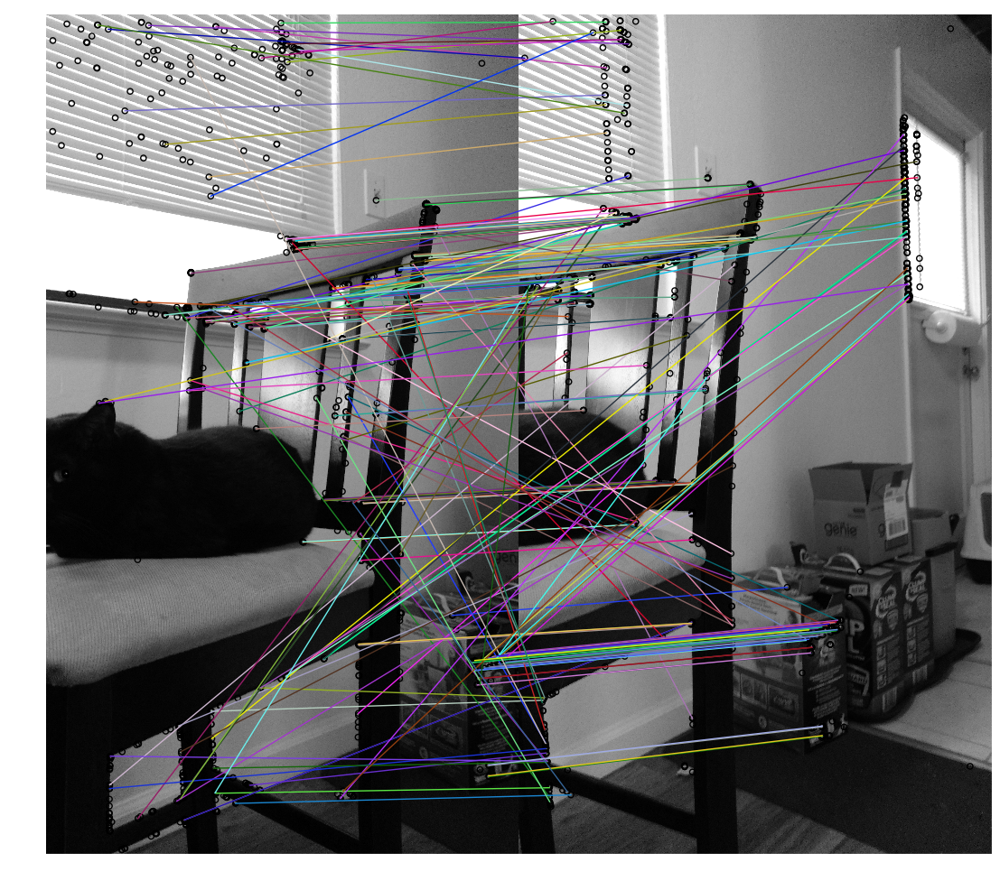

In [26]:
fig, ax = plt.subplots(1, 1, figsize = (15, 12))
plot_matches(ax, gray_imgs[2], gray_imgs[3], img1_key, img2_key, img1_to_img2)
ax.axis('off');

In [27]:
#fig, ax = plt.subplots(1, 1, figsize = (15, 12))
#plot_matches(ax, gray_imgs[2], gray_imgs[3], img2_key, img3_key, img2_to_img3)
#ax.axis('off');

### Step 2: Transform estimation

Apply **Random Sample Consensus (RANSAC)** to filter out false matches iteraively - based on random subsets and majority vote. Happens left to center and right to center. 

In [28]:
from skimage.transform import ProjectiveTransform 
from skimage.measure import ransac 

src_keys = img0_key[img0_to_img1[:, 0]][:, ::-1]
dest_keys = img1_key[img0_to_img1[:, 1]][:, ::-1]

img0_to_img1_model, img0_to_img1_pnts = ransac((src_keys, dest_keys), ProjectiveTransform, 
                                               min_samples = 4, residual_threshold = 1, 
                                               max_trials = 300)

src_keys = img2_key[img1_to_img2[:, 1]][:, ::-1]
dest_keys = img1_key[img1_to_img2[:, 0]][:, ::-1]

img1_to_img2_model, img1_to_img2_pnts = ransac((src_keys, dest_keys), ProjectiveTransform, 
                                               min_samples = 4, residual_threshold = 1, 
                                               max_trials = 300)

Ransac will pull out best subset of matches between the images {img0, img1, and img2}. Plot to see subsets. 

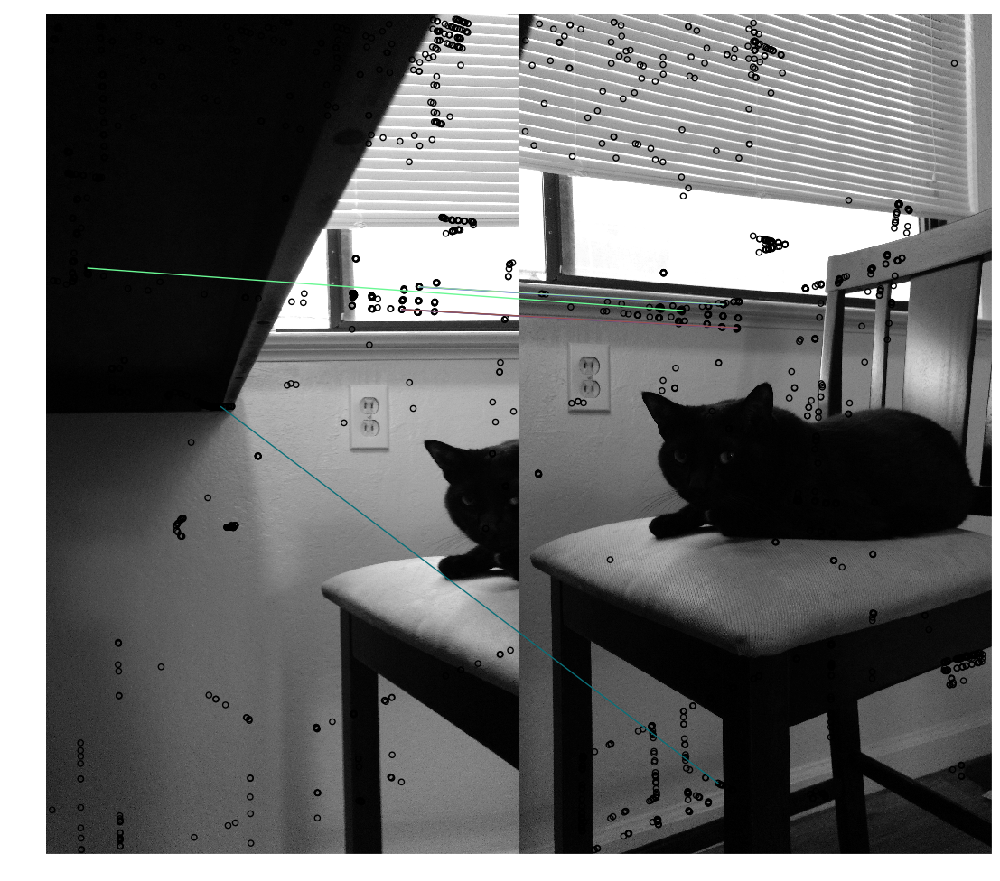

In [29]:
fig, ax = plt.subplots(1, 1, figsize = (15, 12))

plot_matches(ax, img0, img1, img0_key, img1_key, img0_to_img1[img0_to_img1_pnts])
ax.axis('off');

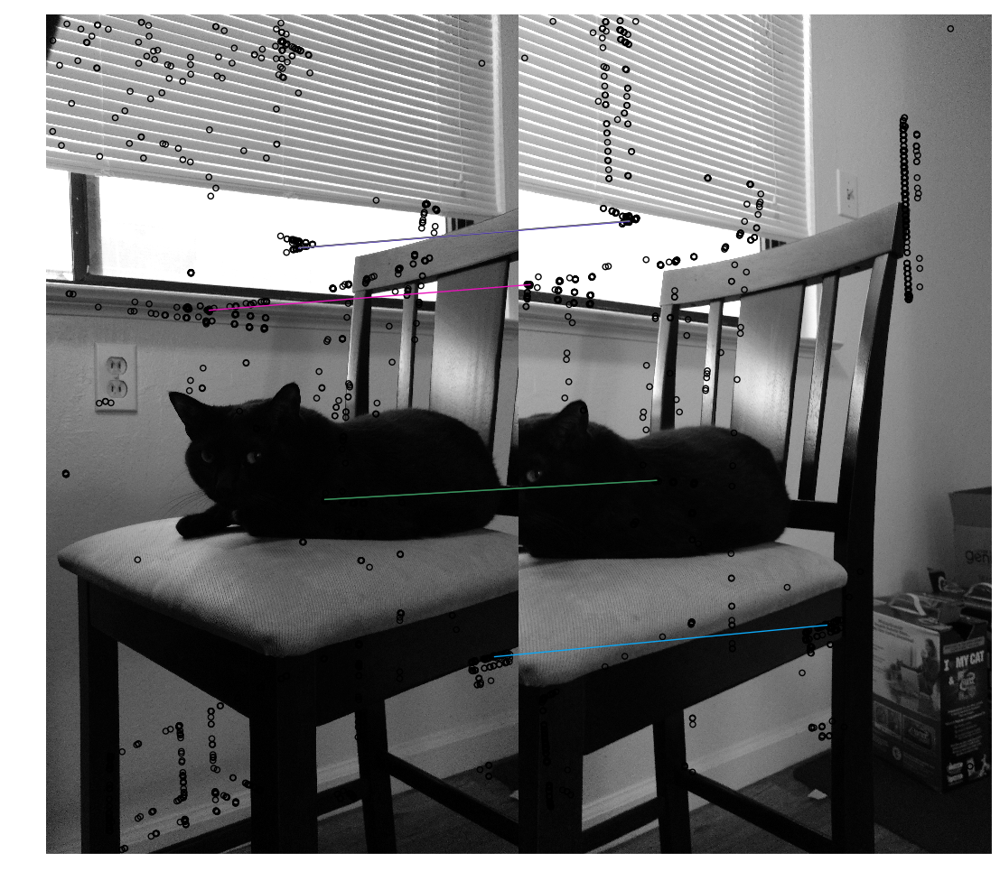

In [30]:
fig, ax = plt.subplots(1, 1, figsize = (15, 12))

plot_matches(ax, img1, img2, img1_key, img2_key, img1_to_img2[img1_to_img2_pnts])
ax.axis('off');

### Step 3: Warp Images Together 

Warp 2 of 3 (or 3 of 4) images to create output as a single stationary image. 

In [31]:
from skimage.transform import SimilarityTransform 
from skimage.transform import warp 

r_shape, c_shape = gray_imgs[2].shape[:2]

## Get coords 
reg_img_coords = np.array([[0, 0],
                          [0, r_shape],
                          [c_shape, 0],
                          [c_shape, r_shape]])

img0_to_img1_coords = img0_to_img1_model(reg_img_coords)
img1_to_img2_coords = img1_to_img2_model(reg_img_coords)

get_all_corners = np.vstack((img0_to_img1_coords, 
                            img1_to_img2_coords,
                            reg_img_coords))

## Warped img min, max, and shape 
w_img_min = np.min(get_all_corners, axis = 0)
w_img_max = np.max(get_all_corners, axis = 0)
w_img_shape = (w_img_max - w_img_min)

w_img_shape = np.ceil(w_img_shape[::-1]).astype(int)
print("Pan. image shape: ", w_img_shape)

## Warping time 
img_off = SimilarityTransform(translation = -w_img_min)
img1_warpdd = warp(gray_imgs[2], img_off.inverse, order = 3,
                 output_shape = w_img_shape, cval = -1)

### Mask = 1 inside 
img1_mask = (img1_warpdd != -1)
### Mask = 0 background 
img1_warpdd[~img1_mask] = 0

Pan. image shape:  [5017 3521]


In [32]:
img0_to_img1_trans = (img0_to_img1_model + img_off).inverse
img0_warpdd = warp(gray_imgs[1], img0_to_img1_trans, order = 3,
                   output_shape = w_img_shape, cval = -1)
img0_mask = (img0_warpdd != -1)
img0_warpdd[~img0_mask] = 0

In [33]:
img1_to_img2_trans = (img1_to_img2_model + img_off).inverse
img2_warpdd = warp(gray_imgs[3], img1_to_img2_trans, order = 3,
                   output_shape = w_img_shape, cval = -1)
img2_mask = (img2_warpdd != -1)
img2_warpdd[~img2_mask] = 0

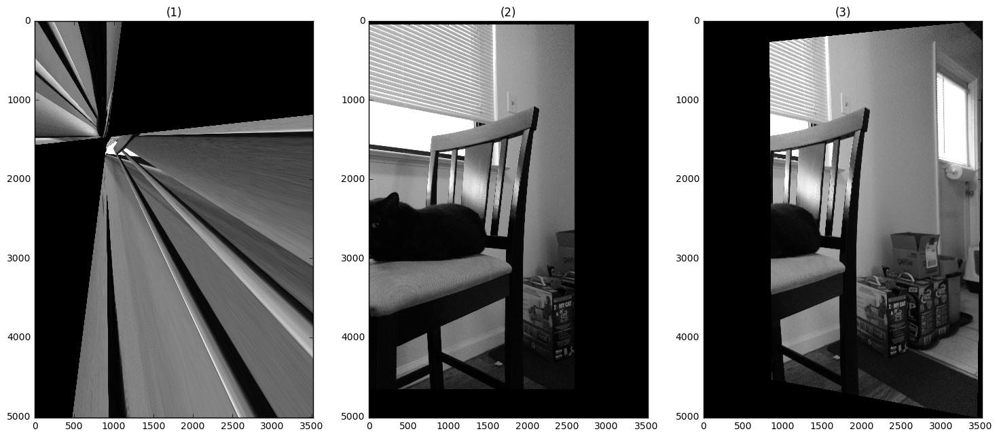

In [34]:
show_images([img0_warpdd, img1_warpdd, img2_warpdd])

### Step 4: Combine and Plot Pan. Image 

Sum, track overlaps, and normalize! 

In [35]:
imgs_merged = (img0_warpdd + img1_warpdd + img2_warpdd)
imgs_overlap = (img0_mask * 1.0 + img1_mask + img2_mask)
imgs_norm = imgs_merged / np.maximum(imgs_overlap, 1)

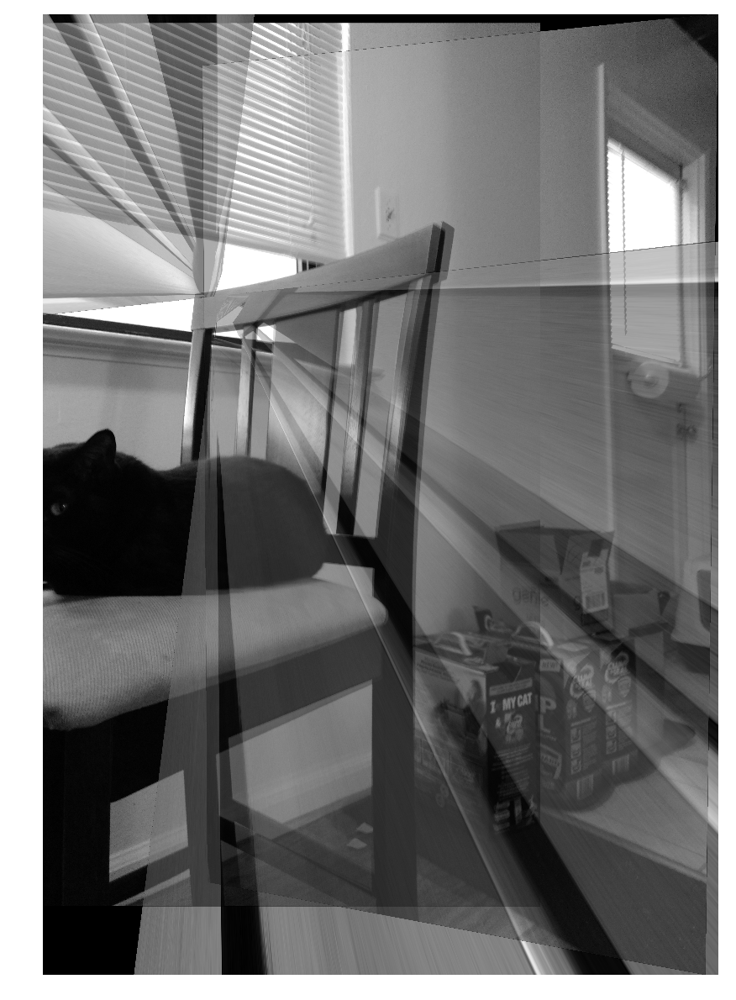

In [36]:
fig, ax = plt.subplots(figsize = (12, 12))
ax.imshow(imgs_norm, cmap = "gray")
plt.tight_layout()
ax.axis("off");

# Extra Question 

Reprocess one of the datasets from [this astro data site](http://www.rawastrodata.com/). 

See types of images at [this site](http://www.rawastrodata.com/[ages/typesofimages.html]).

###### END END 